In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install cuml-cu12

In [3]:
import joblib
import glob
import os
import json
import kagglehub
import pandas as pd
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
import cuml.ensemble
import seaborn as sns

In [4]:
!pip install kagglehub

In [5]:
path = kagglehub.dataset_download("florianhinrichsen/nyc-taxi-data-2023-24-normalized/version/3")

DO_datasets = {f"{path}/hourlyDOs202324_Normalized.parquet": "DOs",
            f"{path}/hourlyDOs202324WEATHER_Normalized.parquet":"DOsWEATHER",
            f"{path}/hourlyDOs202324CYCLt_Normalized.parquet": "DOsCYCLt",
            f"{path}/hourlyDOs202324WEATHER_CYCLt_Normalized.parquet":"DOsWEATHER_CYCLt"}

PU_datasets ={f"{path}/hourlyPUs202324_Normalized.parquet":"PUs",
            f"{path}/hourlyPUs202324WEATHER_Normalized.parquet":"PUsWEATHER",
            f"{path}/hourlyPUs202324CYCLt_Normalized.parquet":"PUsCYCLt",
            f"{path}/hourlyPUs202324WEATHER_CYCLt_Normalized.parquet":"PUsWEATHER_CYCLt"}

ridge_path = kagglehub.dataset_download("florianhinrichsen/ridgeregression")
ridge_files = glob.glob(ridge_path + "/*.pkl")
rf_path = kagglehub.dataset_download("florianhinrichsen/randomforest")
rf_files = glob.glob(rf_path + "/*.pkl")
nn_path = kagglehub.dataset_download("florianhinrichsen/neuralnetwork")
nn_files = glob.glob(nn_path + "/*.keras")


100%|██████████| 1.52G/1.52G [00:14<00:00, 112MB/s] 

Extracting files...


100%|██████████| 58.9k/58.9k [00:00<00:00, 61.4MB/s]

Extracting files...


100%|██████████| 79.5M/79.5M [00:00<00:00, 103MB/s] 

Extracting files...


100%|██████████| 1.85M/1.85M [00:00<00:00, 150MB/s]

Extracting files...


### Plotting Ridge Results

Calculating the Predictions

In [6]:
import pandas as pd
import joblib

# ---------------------------------------------------------
# 1. Generate Predictions: Drop-Off (DO) Datasets
# ---------------------------------------------------------
DO_results = None

# Iterate through the dictionary of Drop-Off files (filepaths as keys, names as values)
for file in DO_datasets:
    df = pd.read_parquet(file)

    # --- Data Preprocessing ---
    # Assume the second column represents the date and rename it accordingly
    df = df.rename(columns={df.columns[1]: "date"})

    # Filter for the relevant years and binary encode them (2023 -> 0, 2024 -> 1)
    df = df[df["year"].isin([2023, 2024])]
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop columns that are not used as features in the Ridge Regression model
    df = df.drop(columns=["DOLocationID", "PULocationID", "precipitation", "total_amount"], errors="ignore")
    df = df.dropna()

    # --- Test Set Extraction ---
    # Isolate 2024 data to serve as the unseen testing set
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Separate the target variable and metadata from the feature matrix (X_test)
    X_test = df_test.drop(columns=["trip_count", "date", "year"])

    # Initialize the results DataFrame on the first loop iteration
    if DO_results is None:
        DO_results = pd.DataFrame({
            "Date": df_test["date"],
            "Actual": df_test["trip_count"]
        }).set_index("Date")

    # --- Model Loading & Prediction ---
    # Locate the matching pre-trained Ridge Regression model for this specific dataset
    right_model = None
    for model in ridge_files:
        if f"{DO_datasets[file]}.pkl" in model:
            right_model = model
            break

    # Load the model and append its predictions as a new column in the results DataFrame
    ridge_model = joblib.load(right_model)
    DO_results[f"{DO_datasets[file]}"] = ridge_model.predict(X_test)


# ---------------------------------------------------------
# 2. Generate Predictions: Pick-Up (PU) Datasets
# ---------------------------------------------------------
PU_results = None

# Iterate through the dictionary of Pick-Up files
for file in PU_datasets:
    df = pd.read_parquet(file)

    # --- Data Preprocessing ---
    # Assume the second column represents the date and rename it accordingly
    df = df.rename(columns={df.columns[1]: "date"})

    # Filter for the relevant years and binary encode them (2023 -> 0, 2024 -> 1)
    df = df[df["year"].isin([2023, 2024])]
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop columns that are not used as features in the Ridge Regression model
    df = df.drop(columns=["DOLocationID", "PULocationID", "precipitation", "total_amount"], errors="ignore")
    df = df.dropna()

    # --- Test Set Extraction ---
    # Isolate 2024 data to serve as the unseen testing set
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Separate the target variable and metadata from the feature matrix (X_test)
    X_test = df_test.drop(columns=["trip_count", "date", "year"])

    # Initialize the results DataFrame on the first loop iteration
    if PU_results is None:
        PU_results = pd.DataFrame({
            "Date": df_test["date"],
            "Actual": df_test["trip_count"]
        }).set_index("Date")

    # --- Model Loading & Prediction ---
    # Locate the matching pre-trained Ridge Regression model for this specific dataset
    right_model = None
    for model in ridge_files:
        if f"{PU_datasets[file]}.pkl" in model:
            right_model = model
            break

    # Load the model and append its predictions as a new column in the results DataFrame
    ridge_model = joblib.load(right_model)
    PU_results[f"{PU_datasets[file]}"] = ridge_model.predict(X_test)


Line plots

In [7]:
# ---------------------------------------------------------
# 1. Reverse Standardization (Unscaling)
# ---------------------------------------------------------
# The models were trained on standardized target variables.
# Revert the predictions and actual values back to their original raw counts
# by applying the original dataset's standard deviation (multiplier) and mean (offset).
#
# Formula: Original = (Standardized * std) + mean
PU_unscaled = (PU_results * 126) + 71
DO_unscaled = (DO_results * 125) + 68

# ---------------------------------------------------------
# 2. Temporal Aggregation
# ---------------------------------------------------------
# Group the daily predictions and actual values by month and sum them
# to evaluate model performance on a macroscopic, monthly level.
PUs_monthly = PU_unscaled.groupby(PU_unscaled.index.month).sum()
DOs_monthly = DO_unscaled.groupby(DO_unscaled.index.month).sum()

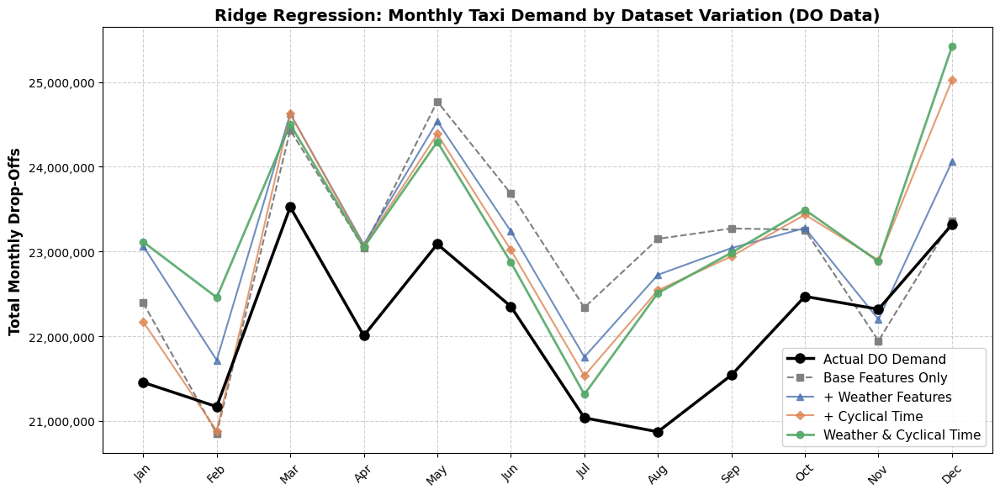

In [8]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ---------------------------------------------------------
# 1. Plot Setup & Initialization
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 6))

# ---------------------------------------------------------
# 2. Line Plot Generation: Actuals vs Predictions (AI generated)
# ---------------------------------------------------------
# Plot Actual Data (Thick black line with large circle markers to stand out)
ax.plot(DOs_monthly.index, DOs_monthly['Actual'], label='Actual DO Demand',
        color='black', linewidth=2.5, marker='o', markersize=8, zorder=5)

# Plot Base Model (Dashed gray with square markers)
ax.plot(DOs_monthly.index, DOs_monthly['DOs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5, marker='s', markersize=6)

# Plot Enhanced Models (Solid colors with distinct markers to differentiate variants)
ax.plot(DOs_monthly.index, DOs_monthly['DOsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, marker='^', markersize=6, alpha=0.8)

ax.plot(DOs_monthly.index, DOs_monthly['DOsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, marker='D', markersize=5, alpha=0.8)

ax.plot(DOs_monthly.index, DOs_monthly['DOsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, marker='o', markersize=6, alpha=0.9)

# ---------------------------------------------------------
# 3. Formatting & Axes Configuration (AI generated)
# ---------------------------------------------------------
# Format X-axis to display month abbreviations rather than raw integer indices
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=range(1, 13), labels=month_names, rotation=45)

# Format Y-axis to include comma separators for large numbers (e.g., 1,500,000)
# Using StrMethodFormatter is generally cleaner and faster than a lambda FuncFormatter
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Set clear titles and labels
ax.set_ylabel("Total Monthly Drop-Offs", fontsize=12, fontweight='bold')
ax.set_title("Ridge Regression: Monthly Taxi Demand by Dataset Variation (DO Data)", fontsize=14, fontweight='bold')

# ---------------------------------------------------------
# 4. Legend, Layout & Export (AI generated)
# ---------------------------------------------------------
ax.legend(loc='best', fontsize=11, framealpha=0.9)

# Add a dashed grid and ensure it renders behind the plot lines
# (AI generated)
ax.grid(True, linestyle='--', alpha=0.6)
ax.set_axisbelow(True)

# Optimize layout to prevent label clipping
fig.tight_layout()

# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/RidgeMonthlyDOs.pdf", dpi=300)
plt.show()

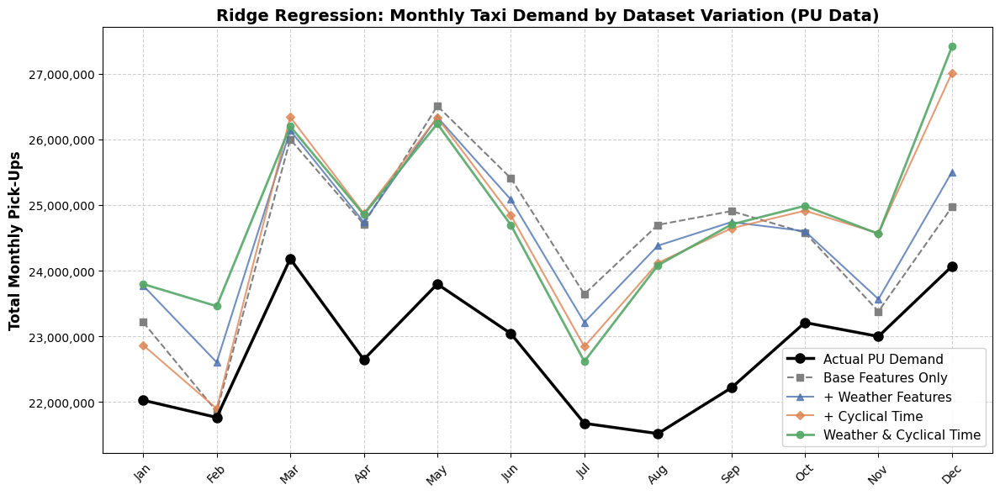

In [9]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ---------------------------------------------------------
# 1. Plot Setup & Initialization
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 6))

# ---------------------------------------------------------
# 2. Line Plot Generation: Actuals vs Predictions (AI generated)
# ---------------------------------------------------------
# Plot Actual Data (Thick black line with large circle markers to stand out)
ax.plot(PUs_monthly.index, PUs_monthly['Actual'], label='Actual PU Demand',
        color='black', linewidth=2.5, marker='o', markersize=8, zorder=5)

# Plot Base Model (Dashed gray with square markers)
ax.plot(PUs_monthly.index, PUs_monthly['PUs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5, marker='s', markersize=6)

# Plot Enhanced Models (Solid colors with distinct markers to differentiate variants)
ax.plot(PUs_monthly.index, PUs_monthly['PUsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, marker='^', markersize=6, alpha=0.8)

ax.plot(PUs_monthly.index, PUs_monthly['PUsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, marker='D', markersize=5, alpha=0.8)

ax.plot(PUs_monthly.index, PUs_monthly['PUsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, marker='o', markersize=6, alpha=0.9)

# ---------------------------------------------------------
# 3. Formatting & Axes Configuration (AI generated)
# ---------------------------------------------------------
# Format X-axis to display month abbreviations rather than raw integer indices
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=range(1, 13), labels=month_names, rotation=45)

# Format Y-axis to include comma separators for large numbers (e.g., 1,500,000)
# Using StrMethodFormatter provides cleaner syntax and better performance than a lambda FuncFormatter
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Set clear titles and labels
ax.set_ylabel("Total Monthly Pick-Ups", fontsize=12, fontweight='bold')
ax.set_title("Ridge Regression: Monthly Taxi Demand by Dataset Variation (PU Data)", fontsize=14, fontweight='bold')

# ---------------------------------------------------------
# 4. Legend, Layout & Export (AI generated)
# ---------------------------------------------------------
ax.legend(loc='best', fontsize=11, framealpha=0.9)

# Add a dashed grid and ensure it renders behind the plot lines
# (AI generated)
ax.grid(True, linestyle='--', alpha=0.6)
ax.set_axisbelow(True)

# Optimize layout to prevent label clipping
fig.tight_layout()

# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/RidgeMonthlyPUs.pdf", dpi=300)
plt.show()

In [10]:

# Group the dataset by the day of the year (1 through 365/366) and calculate
# the total sum of trips per day. This provides a high-granularity view of demand.
PU_daily = PU_unscaled.groupby(PU_unscaled.index.dayofyear).sum()
DO_daily = DO_unscaled.groupby(DO_unscaled.index.dayofyear).sum()


# Daily taxi demand often exhibits strong day-of-the-week seasonality
# (e.g., weekends vs. weekdays). Applying a 7-day rolling mean smooths out
# these short-term fluctuations to reveal the underlying macro trends.
PU_rolling = PU_daily.rolling(window=7).mean()
DO_rolling = DO_daily.rolling(window=7).mean()

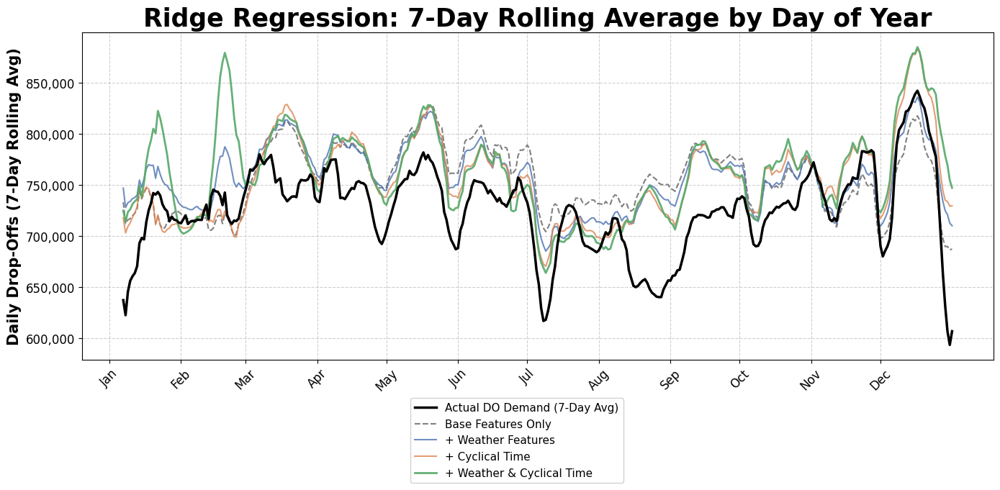

In [11]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ---------------------------------------------------------
# 1. Plot Setup & Initialization
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 7))

# ---------------------------------------------------------
# 2. Line Plot Generation: 7-Day Rolling Averages (AI generated)
# ---------------------------------------------------------
# Plot Actual Data (Thick black line to serve as the baseline ground truth)
ax.plot(DO_rolling.index, DO_rolling['Actual'], label='Actual DO Demand (7-Day Avg)',
        color='black', linewidth=2.5, zorder=5)

# Plot Base Model (Dashed gray line)
ax.plot(DO_rolling.index, DO_rolling['DOs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5)

# Plot Enhanced Models (Solid colors to contrast against the base model)
ax.plot(DO_rolling.index, DO_rolling['DOsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, alpha=0.8)

ax.plot(DO_rolling.index, DO_rolling['DOsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, alpha=0.8)

ax.plot(DO_rolling.index, DO_rolling['DOsWEATHER_CYCLt'], label='+ Weather & Cyclical Time',
        color='#55A868', linewidth=2, alpha=0.9)

# ---------------------------------------------------------
# 3. Formatting & Axes Configuration (AI generated)
# ---------------------------------------------------------
# Map the numerical day of the year to approximate month starting days for readability.
# (Note: These reflect a standard 365-day non-leap year mapping)
month_starts = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=month_starts, labels=month_labels, rotation=45, fontsize=12)

# Format Y-axis to include comma separators for large numbers (e.g., 100,000)
# Replaced lambda FuncFormatter with StrMethodFormatter for cleaner execution
# (AI generated)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)

# Set titles and labels
ax.set_ylabel("Daily Drop-Offs (7-Day Rolling Avg)", fontsize=15, fontweight='bold')
ax.set_title("Ridge Regression: 7-Day Rolling Average by Day of Year", fontsize=25, fontweight='bold')

# ---------------------------------------------------------
# 4. Legend, Layout & Export (AI generated)
# ---------------------------------------------------------
# Position the legend below the plot center to avoid overlapping the data lines
ax.legend(loc='best', fontsize=11, framealpha=0.9, bbox_to_anchor=(0.6, -0.1))

# Add a dashed horizontal grid and ensure it renders behind the plot lines
# (AI generated)
ax.grid(True, linestyle='--', alpha=0.6)
ax.set_axisbelow(True)

# Optimize layout to prevent label clipping
fig.tight_layout()

# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Ridge7DayDOs.pdf", dpi=300)
plt.show()

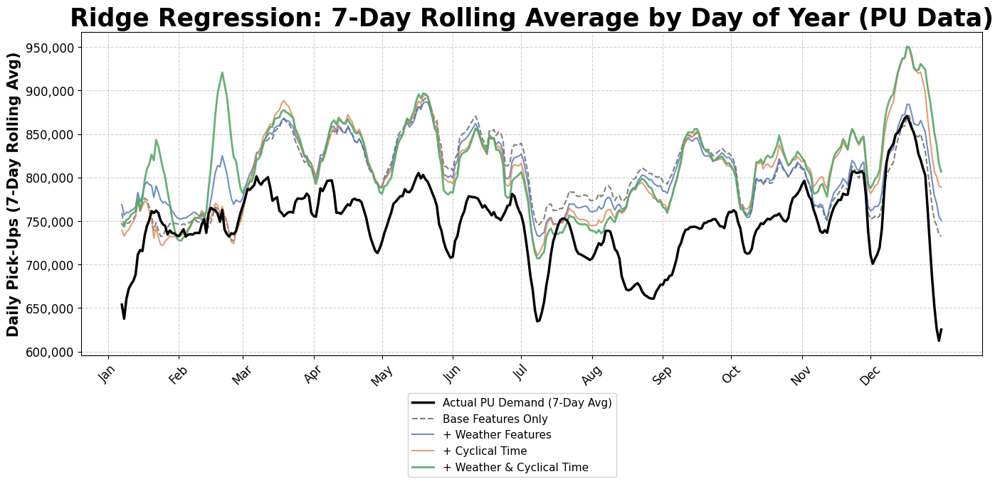

In [12]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ---------------------------------------------------------
# 1. Plot Setup & Initialization
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 7))

# ---------------------------------------------------------
# 2. Line Plot Generation: 7-Day Rolling Averages (AI generated)
# ---------------------------------------------------------
# Plot Actual Data (Thick black line to serve as the baseline ground truth)
ax.plot(PU_rolling.index, PU_rolling['Actual'], label='Actual PU Demand (7-Day Avg)',
        color='black', linewidth=2.5, zorder=5)

# Plot Base Model (Dashed gray line)
ax.plot(PU_rolling.index, PU_rolling['PUs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5)

# Plot Enhanced Models (Solid colors to contrast against the base model)
ax.plot(PU_rolling.index, PU_rolling['PUsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, alpha=0.8)

ax.plot(PU_rolling.index, PU_rolling['PUsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, alpha=0.8)

ax.plot(PU_rolling.index, PU_rolling['PUsWEATHER_CYCLt'], label='+ Weather & Cyclical Time',
        color='#55A868', linewidth=2, alpha=0.9)

# ---------------------------------------------------------
# 3. Formatting & Axes Configuration (AI generated)
# ---------------------------------------------------------
# Map the numerical day of the year to approximate month starting days for readability.
# (Note: These reflect a standard 365-day non-leap year mapping)
month_starts = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=month_starts, labels=month_labels, rotation=45, fontsize=12)

# Format Y-axis to include comma separators for large numbers (e.g., 100,000)
# Replaced lambda FuncFormatter with StrMethodFormatter for cleaner execution
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
ax.tick_params(axis='y', labelsize=12)

# Set titles and labels
ax.set_ylabel("Daily Pick-Ups (7-Day Rolling Avg)", fontsize=15, fontweight='bold')
ax.set_title("Ridge Regression: 7-Day Rolling Average by Day of Year (PU Data)", fontsize=25, fontweight='bold')

# ---------------------------------------------------------
# 4. Legend, Layout & Export (AI generated)
# ---------------------------------------------------------
# Position the legend below the plot center to avoid overlapping the data lines
ax.legend(loc='best', fontsize=11, framealpha=0.9, bbox_to_anchor=(0.6, -0.1))

# Add a dashed horizontal grid and ensure it renders behind the plot lines
# (AI generated)
ax.grid(True, linestyle='--', alpha=0.6)
ax.set_axisbelow(True)

# Optimize layout to prevent label clipping
fig.tight_layout()

# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Ridge7DayPUs.pdf", dpi=300)
plt.show()

Scatter plots

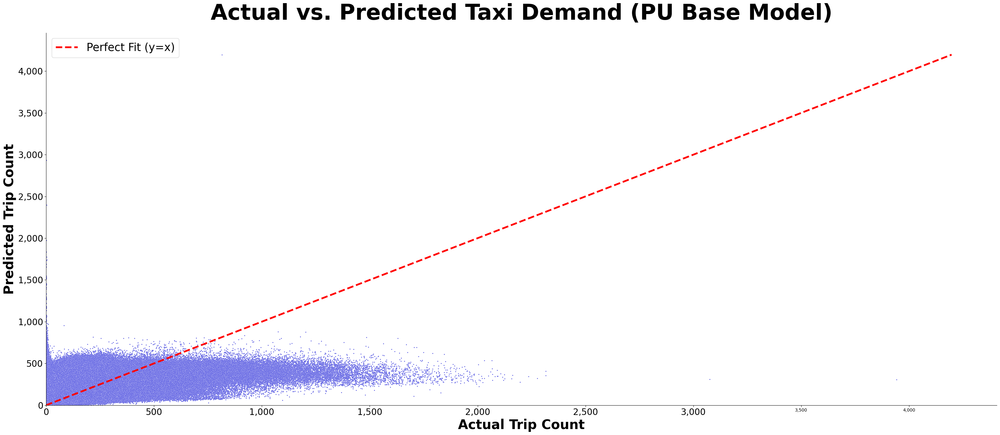

In [13]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# specifically for the baseline Pick-Up (PU) model.
actuals = PU_unscaled["Actual"]
preds = PU_unscaled["PUs"]

# ---------------------------------------------------------
# 2. Plot Setup & Initialization
# ---------------------------------------------------------
# Initialize a large figure size to accommodate the density of the scatter plot
plt.figure(figsize=(32, 14))

# ---------------------------------------------------------
# 3. Scatter Plot Generation
# ---------------------------------------------------------
# Plot the actual vs. predicted values.
# Note: rasterized=True is an excellent choice here. It rasterizes the dense
# scatter points while keeping text/axes vectorized, which prevents exported
# PDF files from becoming excessively large or slow to render.
sns.scatterplot(
    x=actuals,
    y=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the "Perfect Fit" identity line (y = x).
# Points falling exactly on this line indicate perfect predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# ---------------------------------------------------------
# 4. Formatting & Axes Configuration
# ---------------------------------------------------------
# Set clear titles and labels (added 'PU Base Model' for context)
plt.title("Actual vs. Predicted Taxi Demand (PU Base Model)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Actual Trip Count", fontweight="bold", fontsize=30)
plt.ylabel("Predicted Trip Count", fontweight="bold", fontsize=30)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

# Format axes to include comma separators for large trip count numbers
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove the top and right spines for a cleaner, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("Scatter_Actual_vs_Predicted_Styled.png", dpi=300)
plt.show()

In [15]:
# Filter the unscaled Pick-Up (PU) dataset to isolate lower-demand periods.
PU_filtered = PU_unscaled[(PU_unscaled < 2500).all(axis=1)]

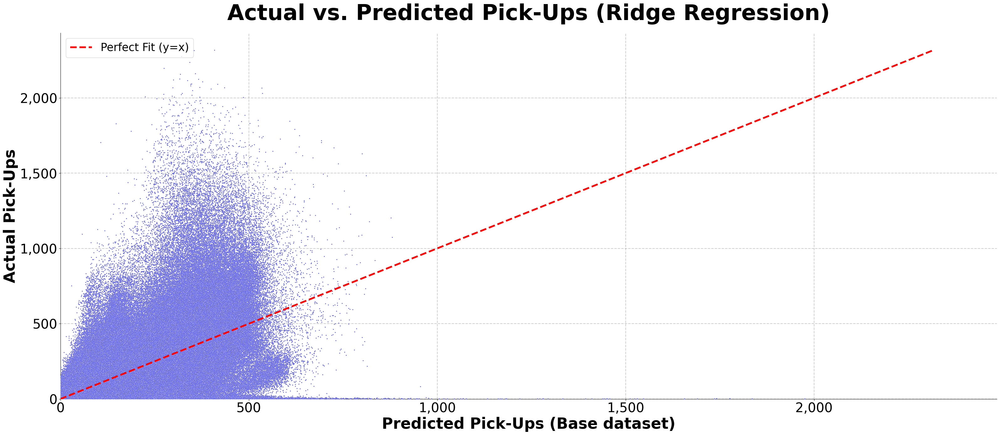

In [16]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Filtered Subset
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset (where all values are < 2,500 trips).
# Note the axis mapping: Predictions are placed on the X-axis, Actuals on the Y-axis.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUs"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. Using rasterized=True is crucial here to prevent
# the exported PDF file size from becoming massive while keeping the axes/text vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid and ensure it renders behind the scatter points using zorder
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Base dataset)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterPUs.pdf", dpi=300)
plt.show()

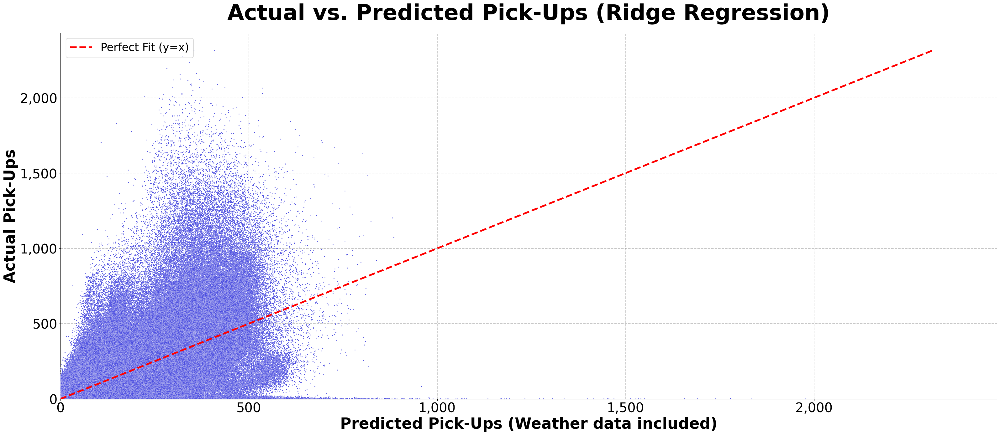

In [17]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather-Enhanced Model
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset specifically for the Weather-enhanced model.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. rasterized=True is retained to prevent the
# exported PDF file size from becoming massive while keeping axes vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid for visual consistency with the previous baseline plot
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Weather data included)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterPUsWEATHER.pdf", dpi=300)
plt.show()

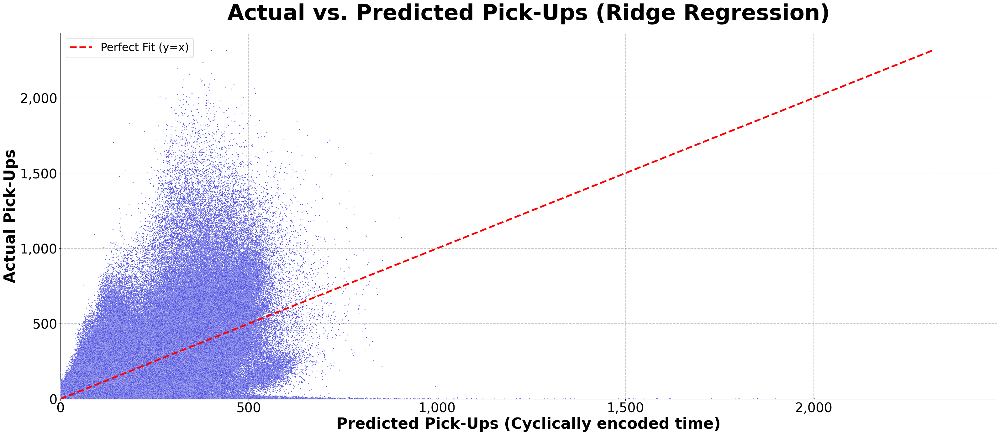

In [18]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Cyclical Time Model
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset specifically for the Cyclically encoded time model.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsCYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. rasterized=True is retained to prevent the
# exported PDF file size from becoming massive while keeping axes vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid for visual consistency with the previous plots
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterPUsCYCLt.pdf", dpi=300)
plt.show()

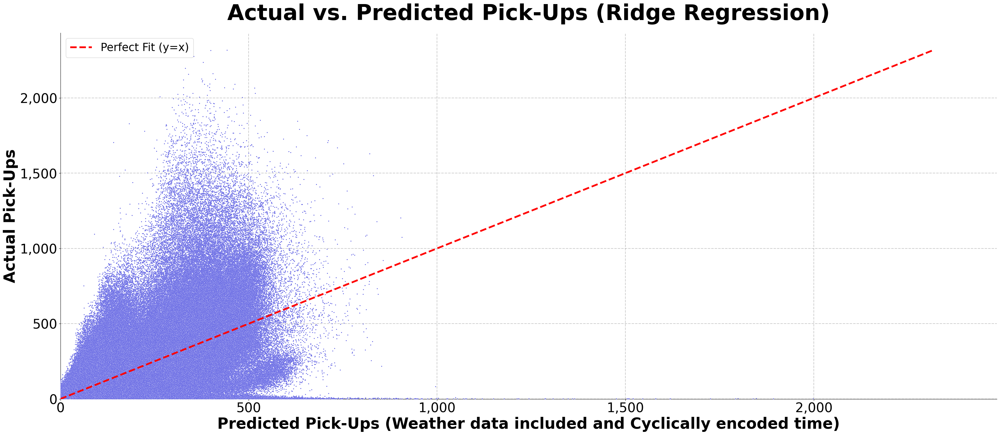

In [19]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather & Cyclical Time Model
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the fully enhanced model
# (incorporating both weather features and cyclically encoded time).
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER_CYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. rasterized=True is retained to prevent the
# exported PDF file size from becoming massive while keeping axes vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid for visual consistency with the previous plots
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterPUsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

In [20]:
# Filter the unscaled Drop-Off (DO) dataset to isolate standard operational periods.
DO_filtered = DO_unscaled[(DO_unscaled < 2500).all(axis=1)]

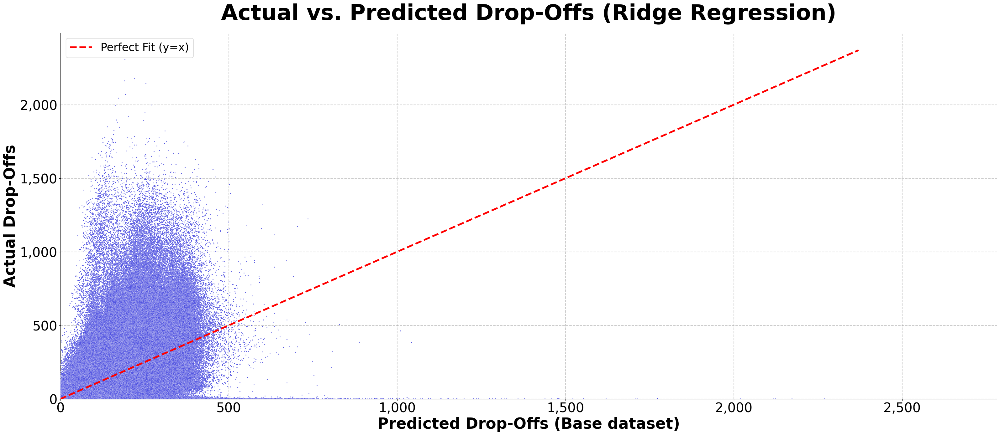

In [21]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Base Model (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the baseline Drop-Off model.
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOs"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. rasterized=True is used to keep the exported
# PDF file size manageable while the text and axes remain fully vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid for visual consistency with the Pick-Up scatter plots
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Base dataset)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterDOs.pdf", dpi=300)
plt.show()

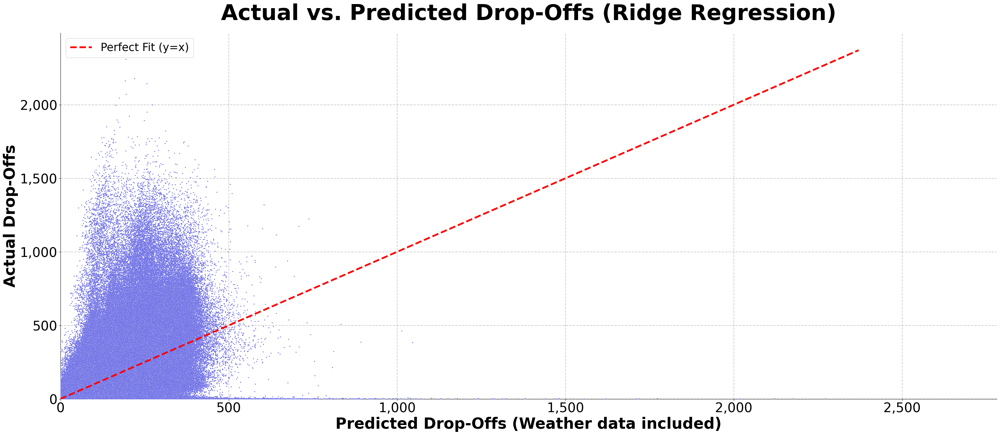

In [22]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather-Enhanced Model (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the Weather-enhanced Drop-Off model.
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. rasterized=True is used to keep the exported
# PDF file size manageable while the text and axes remain fully vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid for visual consistency with the previous scatter plots
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Weather data included)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterDOsWEATHER.pdf", dpi=300)
plt.show()

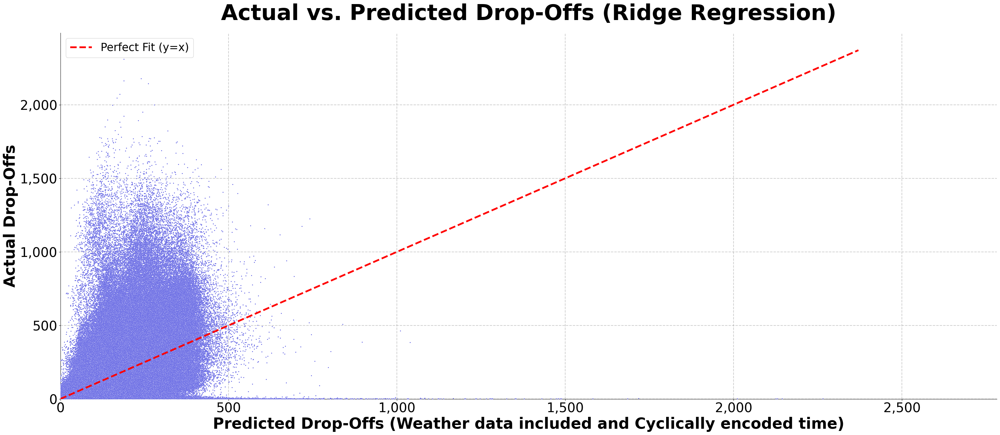

In [23]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather & Cyclical Time Model (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the fully enhanced Drop-Off model
# (incorporating both weather features and cyclically encoded time).
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER_CYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. rasterized=True is retained to prevent the
# exported PDF file size from becoming massive while keeping axes vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid for visual consistency with the previous plots
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterDOsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

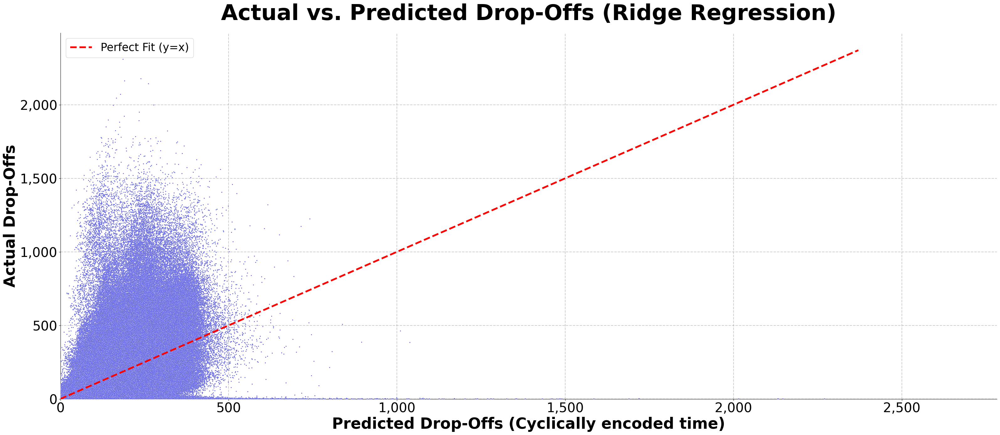

In [24]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Cyclical Time Model (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset specifically for the Drop-Off model with cyclical time features.
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsCYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & Scatter Generation
# ---------------------------------------------------------
# Initialize a large figure size to handle the dense cluster of data points
plt.figure(figsize=(32, 14))

# Render the scatter plot. rasterized=True keeps the exported PDF file size
# manageable while ensuring the axes and text remain fully vectorized.
sns.scatterplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    color="#4C4EE0",
    s=5,
    rasterized=True,
    zorder=3
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add a dashed grid and ensure it renders behind the scatter points using zorder
plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the "Perfect Fit" identity line (y = x).
# Data points falling exactly on this line represent 100% accurate predictions.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a modern, clean aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeScatterDOsCYCLt.pdf", dpi=300)
plt.show()

Histograms

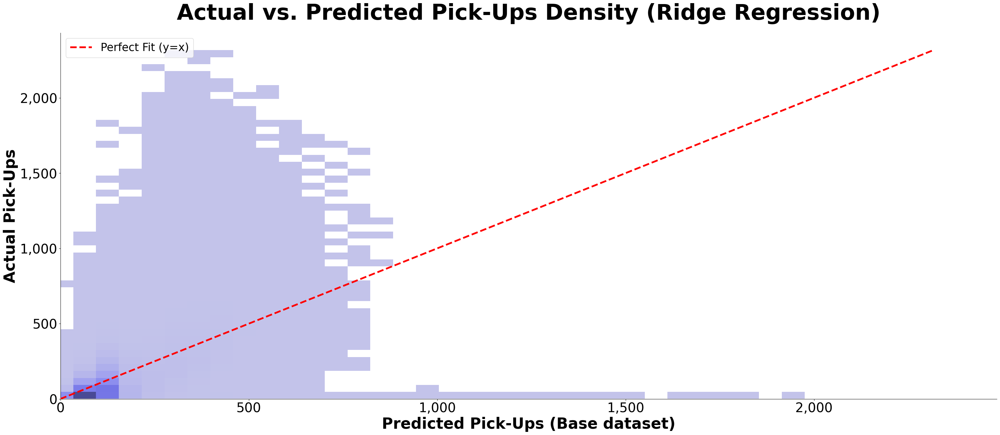

In [25]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Base Model 2D Density (Pick-Ups)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the baseline Pick-Up model.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUs"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram (density plot) using seaborn's histplot.
# Specifying both x and y aggregates overlapping points into bins,
# making dense clusters much easier to interpret than standard scatter plots.
sns.histplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Base dataset)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistPUs.pdf", dpi=300)
plt.show()

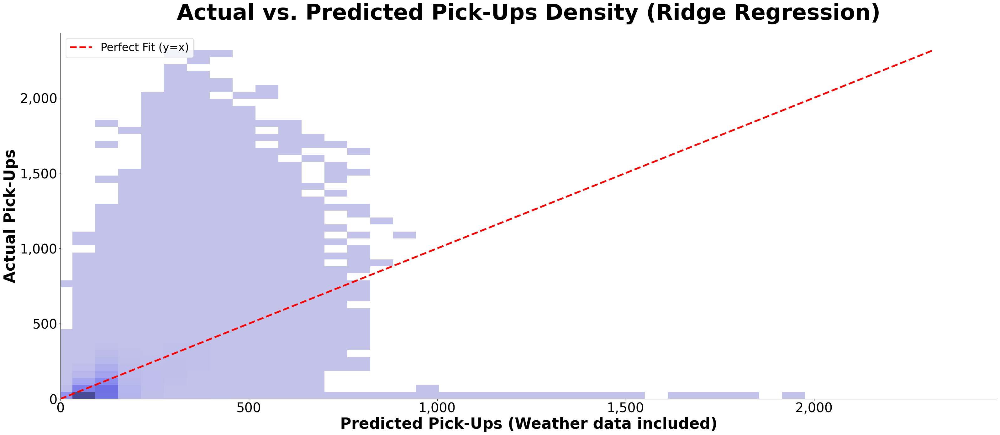

In [26]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather Model 2D Density (Pick-Ups)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the Weather-enhanced Pick-Up model.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram using seaborn's histplot.
# rasterized=True is included to keep exported PDF file sizes optimized.
sns.histplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Weather data included)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistPUsWEATHER.pdf", dpi=300)
plt.show()

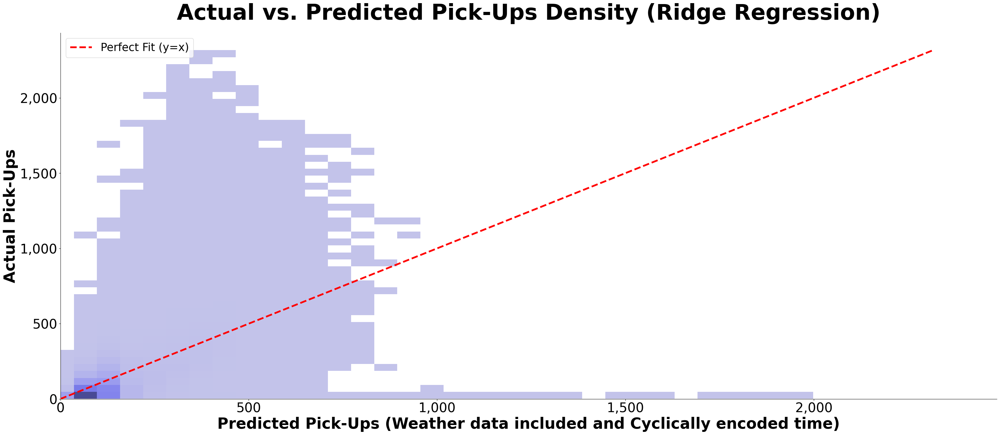

In [27]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather & Cyclical Time Model 2D Density (Pick-Ups)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the fully enhanced Pick-Up model.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER_CYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram using seaborn's histplot.
# rasterized=True is included to keep exported PDF file sizes optimized.
sns.histplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistPUsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

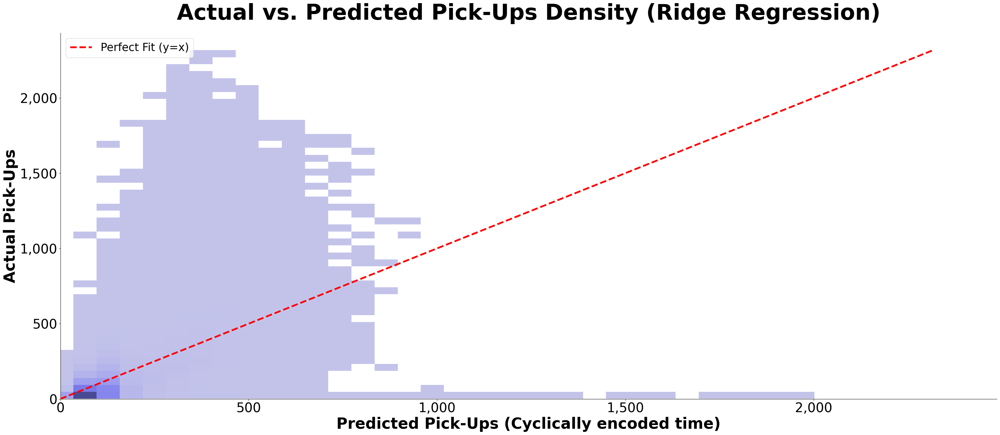

In [28]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Cyclical Time Model 2D Density (Pick-Ups)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the Pick-Up model with cyclical time features.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsCYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram using seaborn's histplot.
# rasterized=True is included to keep exported PDF file sizes optimized.
sns.histplot(
    x=preds,   # Mapped to Predicted Pick-Ups
    y=actuals, # Mapped to Actual Pick-Ups
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Pick-Ups Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Pick-Ups (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistPUsCYCLt.pdf", dpi=300)
plt.show()

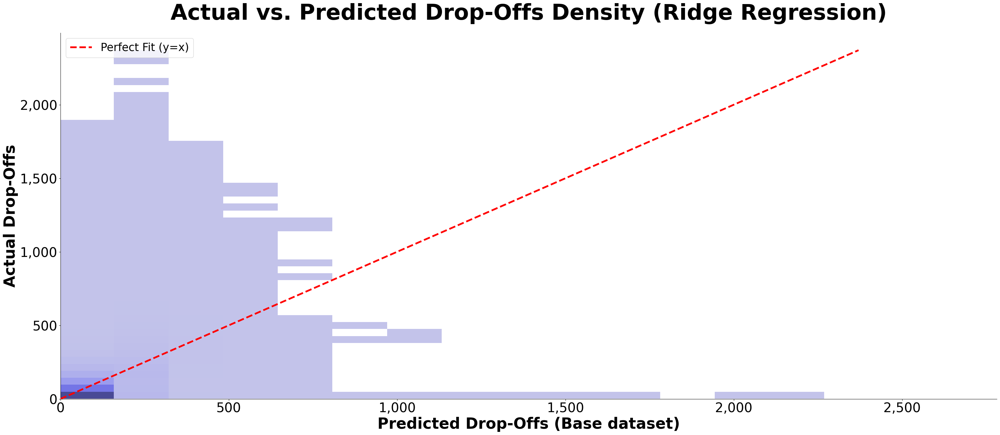

In [29]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Base Model 2D Density (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the baseline Drop-Off model.
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOs"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram using seaborn's histplot.
# rasterized=True is included to keep exported PDF file sizes optimized.
sns.histplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Base dataset)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistDOs.pdf", dpi=300)
plt.show()

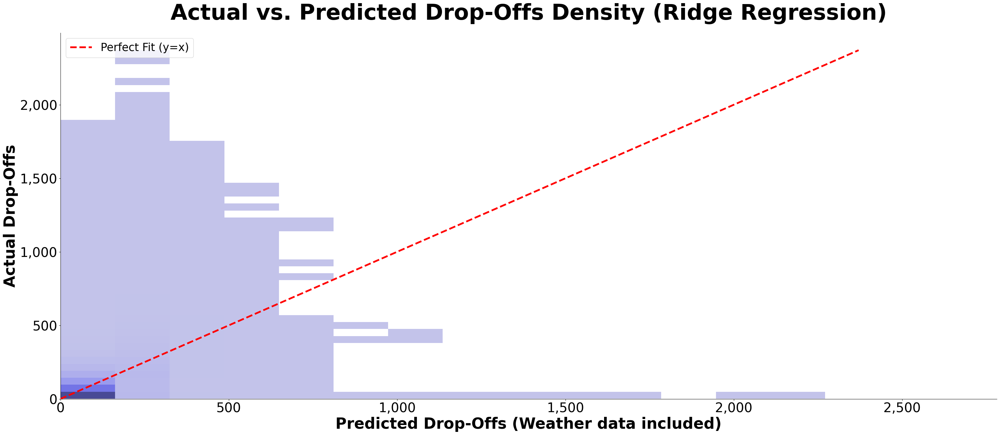

In [30]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather Model 2D Density (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the Weather-enhanced Drop-Off model.
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram using seaborn's histplot.
# rasterized=True is included to keep exported PDF file sizes optimized.
sns.histplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Weather data included)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistDOsWEATHER.pdf", dpi=300)
plt.show()

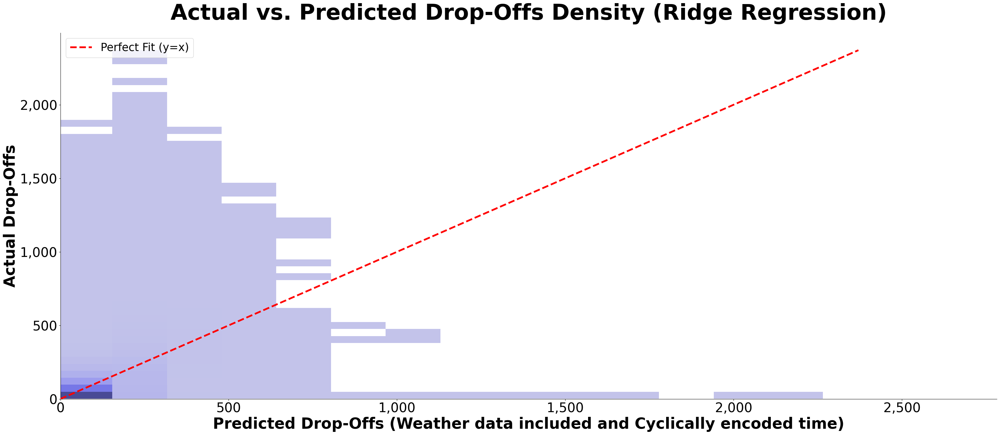

In [31]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Weather & Cyclical Time Model 2D Density (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the fully enhanced Drop-Off model.
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER_CYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram using seaborn's histplot.
# rasterized=True is included to keep exported PDF file sizes optimized.
sns.histplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistDOsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

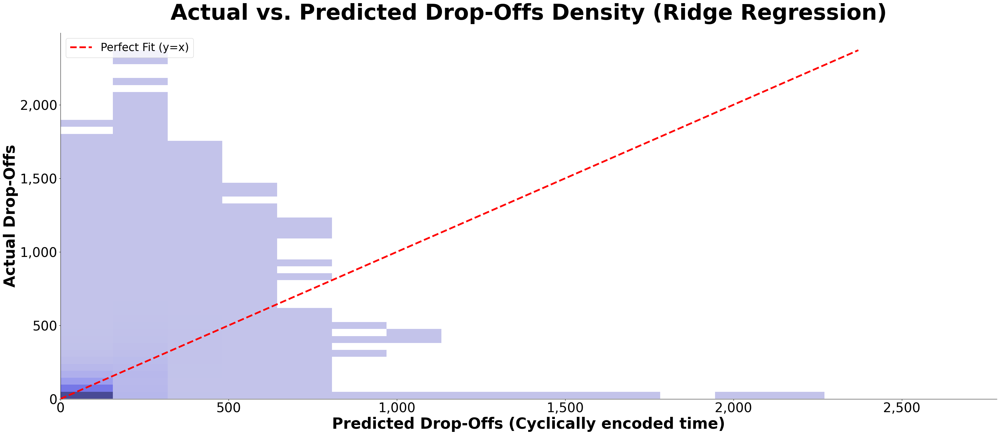

In [32]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ---------------------------------------------------------
# 1. Data Preparation: Cyclical Time Model 2D Density (Drop-Offs)
# ---------------------------------------------------------
# Extract the ground truth (actuals) and model predictions (preds)
# using the filtered dataset for the Drop-Off model with cyclical time features.
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsCYCLt"]

# ---------------------------------------------------------
# 2. Plot Setup & 2D Histogram Generation
# ---------------------------------------------------------
# Initialize a large figure size to clearly display the density distribution
plt.figure(figsize=(32, 14))

# Render a 2D histogram using seaborn's histplot.
# rasterized=True is included to keep exported PDF file sizes optimized.
sns.histplot(
    x=preds,   # Mapped to Predicted Drop-Offs
    y=actuals, # Mapped to Actual Drop-Offs
    bins=50,
    color="#4C4EE0",
    rasterized=True
)

# ---------------------------------------------------------
# 3. Reference Line & Grid Setup
# ---------------------------------------------------------
# Add the "Perfect Fit" identity line (y = x) to benchmark model accuracy.
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)', zorder=4)

# ---------------------------------------------------------
# 4. Text Formatting & Axes Configuration
# ---------------------------------------------------------
plt.title("Actual vs. Predicted Drop-Offs Density (Ridge Regression)", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Predicted Drop-Offs (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Format axes to include comma separators (e.g., "2,000") for readability
# (AI generated)
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Constrain both axes to start exactly at zero
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove top and right spines for a clean, modern aesthetic
sns.despine()

# ---------------------------------------------------------
# 5. Legend, Layout & Export
# ---------------------------------------------------------
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
# plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Scatter_Hist/RidgeHistDOsCYCLt.pdf", dpi=300)
plt.show()

Calculating Permutation Feature Importance

In [33]:
import os
import joblib
import pandas as pd
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error

def ridge_scorer_DO(estimator, X, y):
    """
    Custom evaluation metric for the Drop-Off model.
    Since the target variable was scaled during training, this function
    inverses the scaling (multiply by 125, add 68) for both predictions
    and actuals to calculate the true Mean Absolute Error in actual trip counts.
    Returns negative MAE because scikit-learn optimization maximizes scores.
    """
    y_pred = estimator.predict(X)

    y_pred_unscaled = (y_pred * 125) + 68
    y_unscaled = (y * 125) + 68

    return -mean_absolute_error(y_unscaled, y_pred_unscaled)


# Iterate over all Drop-Off dataset variations in the dictionary
for file in DO_datasets:
    # ---------------------------------------------------------
    # 1. Data Loading & Preprocessing
    # ---------------------------------------------------------
    df = pd.read_parquet(file)

    # Standardize the date column name
    df = df.rename(columns={df.columns[1]:"date"})

    # Filter for the relevant years (2023 for training/val, 2024 for testing)
    df = df[df["year"].isin([2023, 2024])]

    # Binarize the year feature (2023 -> 0, 2024 -> 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop identifier and target-leakage columns if they exist in this dataset variant
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows with missing values to ensure the model can predict cleanly
    df = df.dropna()

    # ---------------------------------------------------------
    # 2. Test Set Isolation
    # ---------------------------------------------------------
    # Create the test holdout set using only data from 2024
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Separate features (X) from the target variable (y)
    X_test = df_test.drop(columns=["trip_count", "date", "year"])
    y_test = df_test["trip_count"]

    # Extract the dataset's logical name (e.g., "DOsWEATHER_CYCLt")
    dataset_name = DO_datasets[file]

    # ---------------------------------------------------------
    # 3. Model Loading & Baseline Scoring
    # ---------------------------------------------------------
    # Scan the local list of model paths to find the exact .pkl file matching this dataset
    right_model = None
    for model in ridge_files:
        if f"{dataset_name}.pkl" in model:
            right_model = model
            break

    print("1") # Debug print to confirm a model match was found

    # Load the trained Ridge model into memory
    ridge_model = joblib.load(right_model)

    # Calculate the un-shuffled baseline MAE on the 2024 test set
    baseline = ridge_scorer_DO(ridge_model, X_test, y_test)

    # ---------------------------------------------------------
    # 4. Logical Feature Grouping (AI generated)
    # ---------------------------------------------------------
    # We group highly correlated features (like cyclical time or weather components)
    # so they are shuffled together, preventing them from compensating for each other.
    groups = {}
    grouped_cols = []

    # Group 1: Weather Features
    if "WEATHER" in dataset_name:
        weather_keywords = ["snow_depth", "snowfall", "rain", "apparent_temperature"]
        # Find all columns containing any of the weather keywords
        weather_cols = [c for c in X_test.columns if any(w in c for w in weather_keywords)]
        if weather_cols:
            groups["Weather Features"] = weather_cols
            grouped_cols.extend(weather_cols)

    # Group 2: Cyclical Time Features (sine/cosine pairs)
    if "CYCLt" in dataset_name:
        for t in ["month", "day", "hour", "DoW"]:
            # Find the sin and cos pair for the specific time unit (e.g., hour_sin and hour_cos)
            cols = [c for c in X_test.columns if t in c and any(s in c for s in ["sin", "cos"]) and c not in grouped_cols]
            if cols:
                groups[t] = cols
                grouped_cols.extend(cols)

    # Group 3: Standard Single Features
    # Any column not caught by the weather or cyclical rules is treated as its own group
    for c in X_test.columns:
        if c not in grouped_cols:
            groups[c] = [c]

    # ---------------------------------------------------------
    # 5. Grouped Permutation Shuffle (AI generated)
    # ---------------------------------------------------------
    result = {}
    for name, cols in groups.items():
        drops = []
        # Repeat the shuffle 10 times per feature group for statistical stability
        for i in range(10):
            X_shuff = X_test.copy()

            # Shuffle the rows of all columns in the current group simultaneously
            # random_state ensures reproducibility across runs
            X_shuff[cols] = X_shuff[cols].sample(frac=1, random_state=100+i).values

            # Recalculate MAE on the broken data
            score = ridge_scorer_DO(ridge_model, X_shuff, y_test)

            # The "drop" is how much worse the model performed.
            # Larger drop = more important feature.
            drops.append(baseline - score)

        # Average the performance drop over the 10 iterations
        result[name] = sum(drops) / 10

    # ---------------------------------------------------------
    # 6. Export Results to CSV
    # ---------------------------------------------------------
    # Package the grouped importances into a DataFrame
    importance_df = pd.DataFrame({
        "Model": dataset_name,
        "Feature": list(result.keys()),
        "Importance": list(result.values())
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Ridge Regression/RidgePermutationImportances_DOs.csv"

    # If the CSV doesn't exist yet, create it and write the headers.
    # If it does exist, append the new rows to the bottom without writing the header again.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)

1
1
1
1


In [34]:
import os
import joblib
import pandas as pd
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error

def ridge_scorer_PU(estimator, X, y):
    """
    Custom evaluation metric for the Pick-Up (PU) model.
    Reverses the Standard/MinMax scaling applied during preprocessing
    (multiplying by 126 and adding 71 for Pick-Ups specifically) so that the
    Mean Absolute Error reflects real-world trip counts.
    Returns negative MAE to align with scikit-learn's "higher is better" optimization.
    """
    y_pred = estimator.predict(X)

    y_pred_unscaled = (y_pred * 126) + 71
    y_unscaled = (y * 126) + 71

    return -mean_absolute_error(y_unscaled, y_pred_unscaled)


# Iterate over all Pick-Up dataset variations mapped in PU_datasets
for file in PU_datasets:
    # ---------------------------------------------------------
    # 1. Data Loading & Preprocessing
    # ---------------------------------------------------------
    df = pd.read_parquet(file)

    # Standardize the datetime column name (assuming it's the second column)
    df = df.rename(columns={df.columns[1]:"date"})

    # Filter to only include the target study years (2023 and 2024)
    df = df[df["year"].isin([2023, 2024])]

    # Binarize the year feature to prevent the model from treating it as a continuous magnitude
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop location IDs (categorical/not used for this regression) and variables
    # that would cause target leakage (total_amount) or are unused (precipitation)
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Clean up any missing values generated by preprocessing
    df = df.dropna()

    # ---------------------------------------------------------
    # 2. Test Set Isolation
    # ---------------------------------------------------------
    # Define the out-of-sample test set (all data from 2024)
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Separate predictors (X) from the target (y)
    X_test = df_test.drop(columns=["trip_count", "date", "year"])
    y_test = df_test["trip_count"]

    # Retrieve the logical dataset name (e.g., "PUsWEATHER_CYCLt")
    dataset_name = PU_datasets[file]

    # ---------------------------------------------------------
    # 3. Model Loading & Baseline Scoring
    # ---------------------------------------------------------
    # Find the corresponding saved .pkl model for this dataset iteration
    right_model = None
    for model in ridge_files:
        if f"{dataset_name}.pkl" in model:
            right_model = model
            break

    print("1") # Debug flag confirming the correct model was matched

    # Load the matching Pick-Up model from disk/Kaggle cache
    ridge_model = joblib.load(right_model)

    # Evaluate the baseline MAE before any features are shuffled
    baseline = ridge_scorer_PU(ridge_model, X_test, y_test)

    # ---------------------------------------------------------
    # 4. Feature Grouping Logic (AI generated)
    # ---------------------------------------------------------
    # We group highly correlated features together so they are permuted simultaneously.
    # Otherwise, correlated features might "cover" for each other, falsely lowering their importance.
    groups = {}
    grouped_cols = []

    # Group 1: Weather Features
    if "WEATHER" in dataset_name:
        weather_keywords = ["snow_depth", "snowfall", "rain", "apparent_temperature"]
        weather_cols = [c for c in X_test.columns if any(w in c for w in weather_keywords)]
        if weather_cols:
            groups["Weather Features"] = weather_cols
            grouped_cols.extend(weather_cols)

    # Group 2: Cyclical Time Features
    if "CYCLt" in dataset_name:
        for t in ["month", "day", "hour", "DoW"]:
            # Isolate sine/cosine pairs for the exact time unit
            cols = [c for c in X_test.columns if t in c and any(s in c for s in ["sin", "cos"]) and c not in grouped_cols]
            if cols:
                groups[t] = cols
                grouped_cols.extend(cols)

    # Group 3: Independent Features
    # Any columns not caught in the groupings above are treated as standalone features
    for c in X_test.columns:
        if c not in grouped_cols:
            groups[c] = [c]

    # ---------------------------------------------------------
    # 5. Permutation Importance (Grouped Shuffle) (AI generated)
    # ---------------------------------------------------------
    result = {}
    for name, cols in groups.items():
        drops = []
        # Run 10 iterations per group to reduce random noise in the importance scores
        for i in range(10):
            X_shuff = X_test.copy()

            # Shuffle the entire group's values along the rows using a set random seed
            X_shuff[cols] = X_shuff[cols].sample(frac=1, random_state=100+i).values

            # Calculate how much the MAE degraded on the shuffled data
            score = ridge_scorer_PU(ridge_model, X_shuff, y_test)
            drops.append(baseline - score) # Larger difference = higher importance

        # Store the mean performance drop across the 10 iterations
        result[name] = sum(drops) / 10

    # ---------------------------------------------------------
    # 6. CSV Export Logic
    # ---------------------------------------------------------
    # Convert results dictionary into a structured DataFrame
    importance_df = pd.DataFrame({
        "Model": dataset_name,
        "Feature": list(result.keys()),
        "Importance": list(result.values())
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Ridge Regression/RidgePermutationImportances_PUs.csv"

    # Create the CSV with headers if this is the first run, otherwise append
    # the new rows to the existing file.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)

1
1
1
1


Plotting Correlation Coefficients

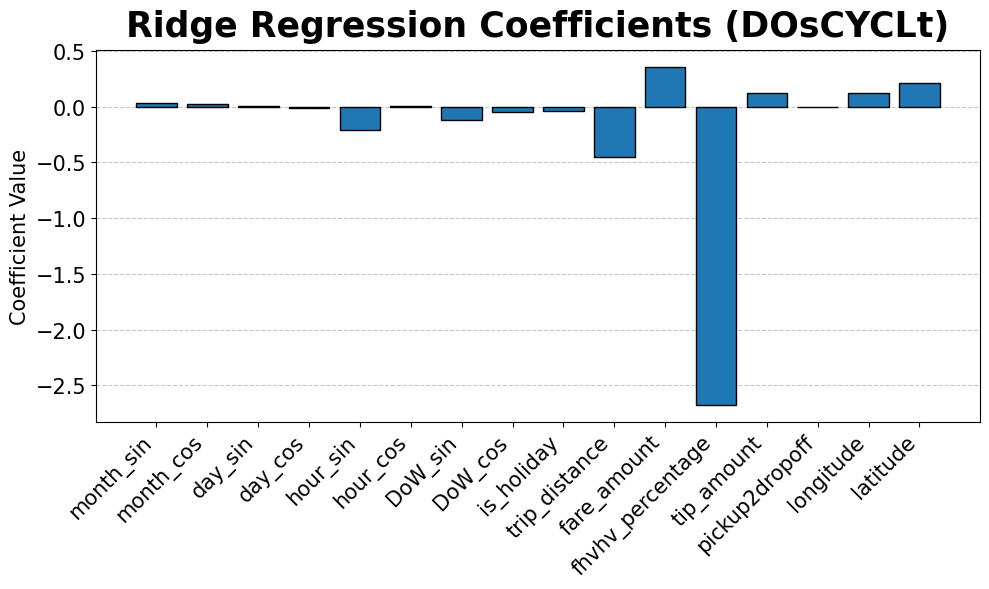

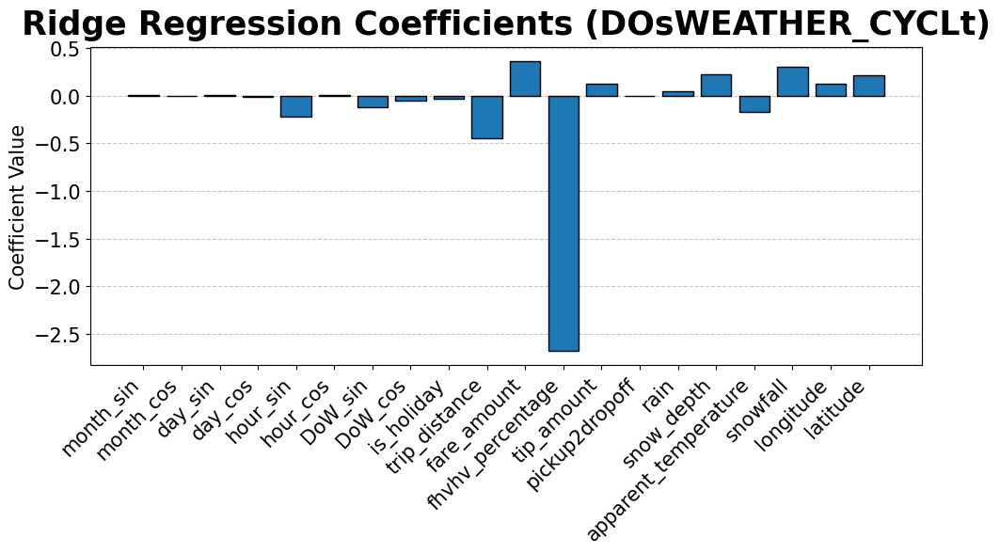

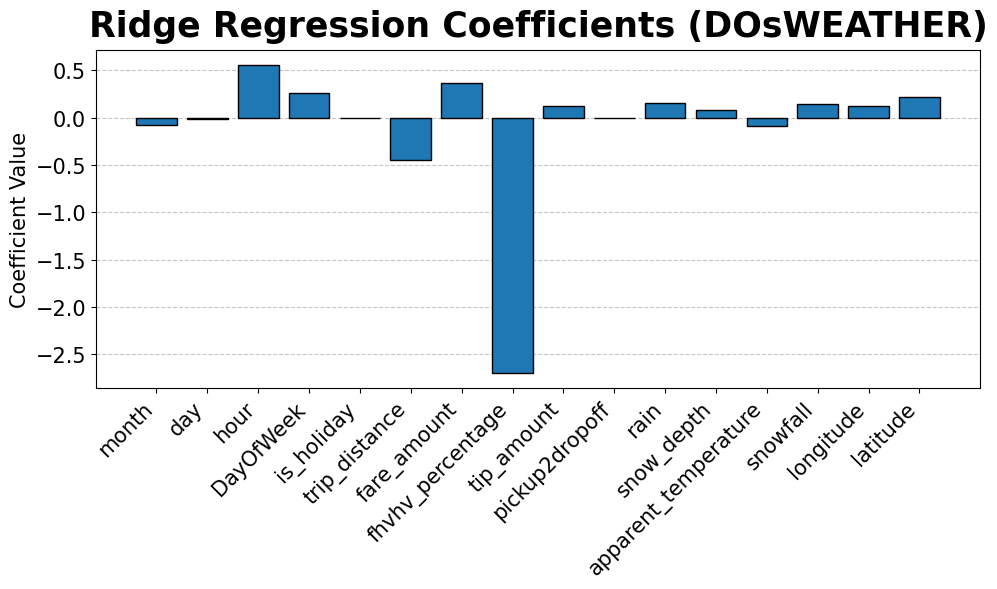

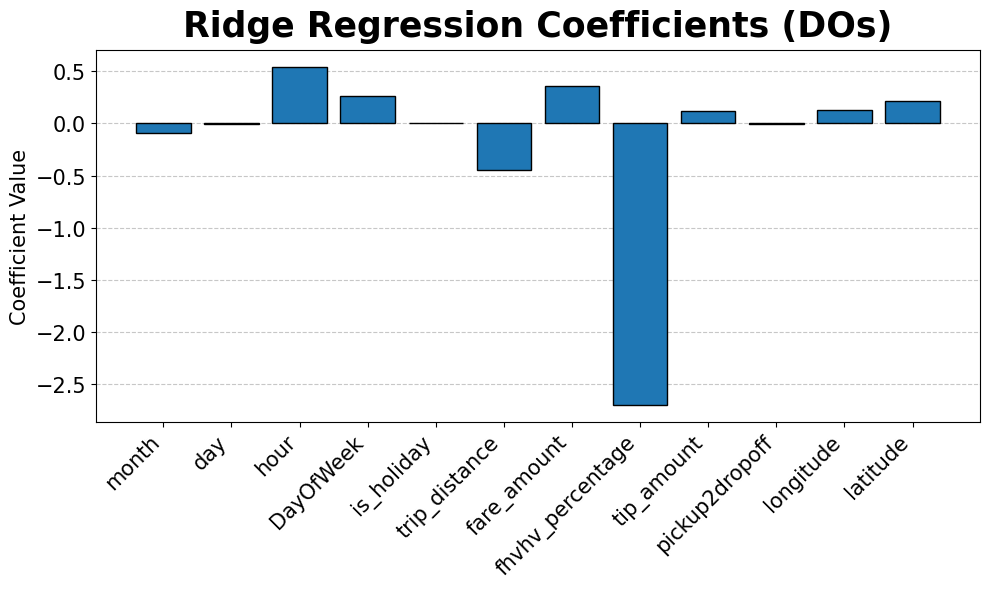

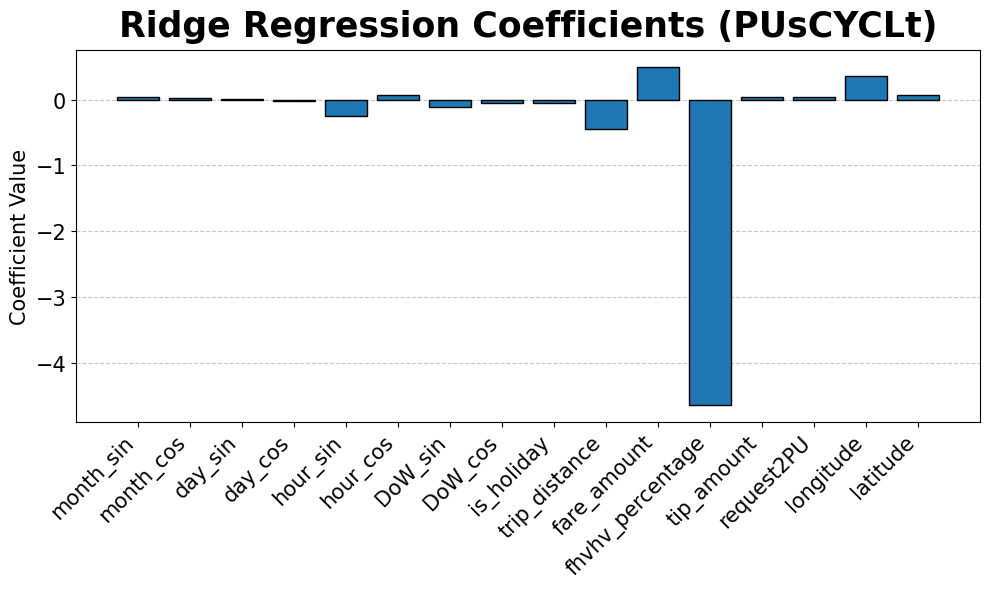

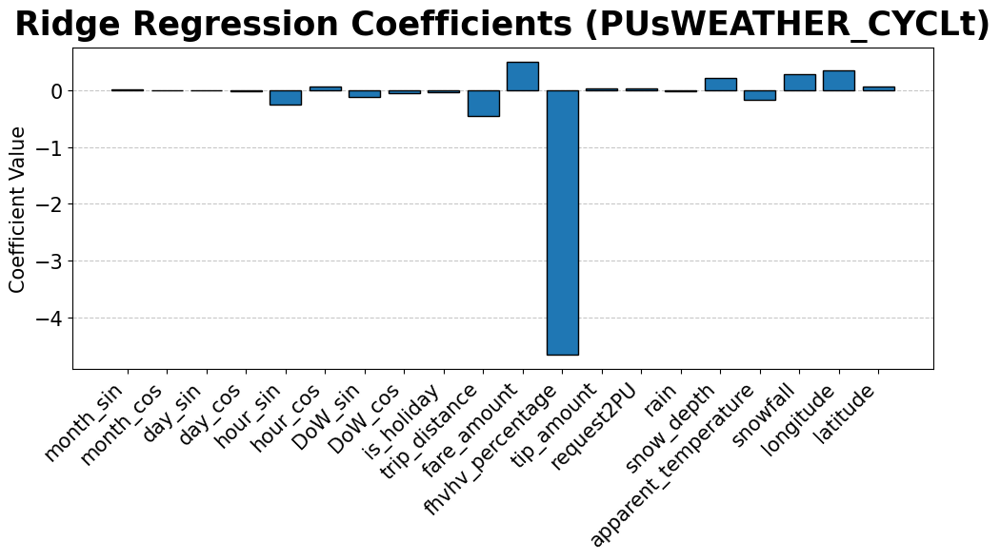

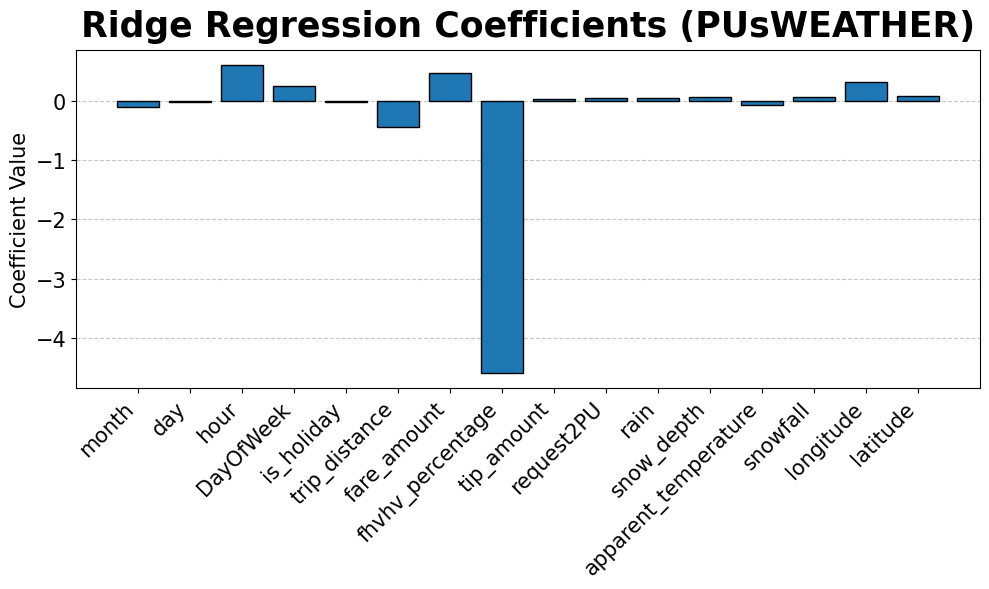

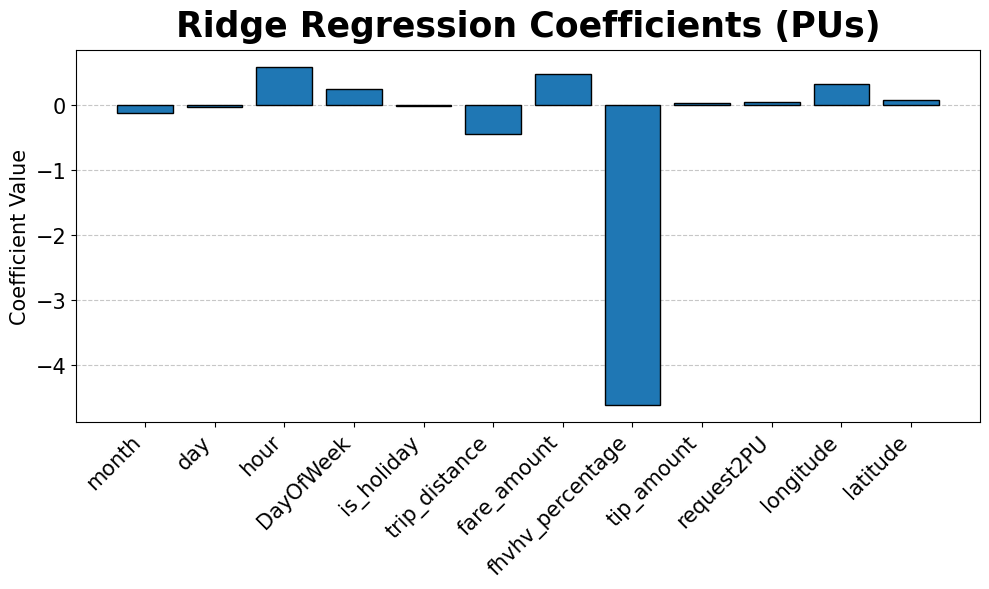

In [35]:
import json
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Load Coefficient Data from JSON
# ---------------------------------------------------------
# Define the path to the JSON file containing the extracted model coefficients
file_path = ridge_path + "/ModelCoefficients.json"

# Read the JSON file into a Pandas DataFrame.
# Expected structure: Columns are dataset names, rows include a "coefficients" key containing a dict.
df = pd.read_json(file_path)

# Iterate through every dataset column in the JSON file
for dataset_name in df.columns:

    # ---------------------------------------------------------
    # 2. Extract & Format Coefficient Data
    # ---------------------------------------------------------
    # Isolate the dictionary of coefficients for the current dataset model
    coefficients_dict = df.loc["coefficients", dataset_name]

    # Convert the dictionary into a Pandas Series for easy plotting
    coeff_series = pd.Series(coefficients_dict)

    # Extract the feature names (x-axis) and their corresponding coefficient values (y-axis)
    features = coeff_series.index.tolist()
    values = coeff_series.values.tolist()

    # ---------------------------------------------------------
    # 3. Plot Configuration
    # ---------------------------------------------------------
    fig, ax = plt.subplots(figsize=(10, 6))

    # Render a standard vertical bar chart with distinct borders
    ax.bar(features, values, color="C0", edgecolor="black")

    # Clean up the dataset string to create a readable title
    # (e.g., "df_PUsWEATHER_model.pkl" -> "PUsWEATHER")
    clean_name = dataset_name.replace("df_","").replace("_model.pkl","")

    # Add descriptive titles and y-axis labels
    ax.set_title(f"Ridge Regression Coefficients ({clean_name})", fontsize=25, fontweight="bold", pad=10)
    ax.set_ylabel("Coefficient Value", fontsize=15)

    # ---------------------------------------------------------
    # 4. Axis & Grid Formatting
    # ---------------------------------------------------------
    # Ensure every feature gets a tick mark, and rotate labels 45 degrees
    # to prevent long feature names from overlapping
    ax.set_xticks(range(len(features)))
    ax.set_xticklabels(features, rotation=45, ha="right", fontsize=15)
    ax.tick_params(axis="y", labelsize=15)

    # Add a horizontal dashed grid placed *behind* the bars (set_axisbelow) for readability
    ax.yaxis.grid(True, linestyle="--", alpha=0.7)
    ax.set_axisbelow(True)

    # ---------------------------------------------------------
    # 5. Export and Clean Up
    # ---------------------------------------------------------
    # Adjust layout to prevent rotated x-axis labels from being cut off
    fig.tight_layout()

    # Save the plot as a high-resolution PDF for the thesis
    plt.savefig(f"drive/MyDrive/BT_Florian_2026/Evaluation Plots/Ridge/Ridge_Coefficients_{dataset_name}.pdf", dpi=300)

    # Display the plot inline (useful if running in a Jupyter Notebook)
    plt.show()

    # Close the figure to free up memory before the next loop iteration
    plt.close(fig)